In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


#### Loading the Dataset

In [2]:
df=pd.read_csv("sucide_case.csv")
df

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,15,66,24,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,15,66,24,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,15,66,24,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,15,66,24,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,15,66,24,900",796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation Z


#### check the basic info

In [3]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27820 entries, 0 to 27819
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   country             27820 non-null  object 
 1   year                27820 non-null  int64  
 2   sex                 27820 non-null  object 
 3   age                 27820 non-null  object 
 4   suicides_no         27820 non-null  int64  
 5   population          27820 non-null  int64  
 6   suicides/100k pop   27820 non-null  float64
 7   country-year        27820 non-null  object 
 8   HDI for year        8364 non-null   float64
 9    gdp_for_year ($)   27820 non-null  object 
 10  gdp_per_capita ($)  27820 non-null  int64  
 11  generation          27820 non-null  object 
dtypes: float64(2), int64(4), object(6)
memory usage: 2.5+ MB


#### check null values

In [4]:
df.isna().sum()

country                   0
year                      0
sex                       0
age                       0
suicides_no               0
population                0
suicides/100k pop         0
country-year              0
HDI for year          19456
 gdp_for_year ($)         0
gdp_per_capita ($)        0
generation                0
dtype: int64

#### check for duplicate

In [5]:
df.duplicated().sum()
df = df.drop_duplicates()

In [6]:
df

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,15,66,24,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,15,66,24,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,15,66,24,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,15,66,24,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,15,66,24,900",796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation Z


#### Clean and Convert Data Types

In [7]:
# Ensure numeric columns are in correct format
df['suicides_no'] = pd.to_numeric(df['suicides_no'], errors='coerce')
df['gdp_per_capita ($)'] = pd.to_numeric(df['gdp_per_capita ($)'], errors='coerce')


In [8]:
df.dtypes[['suicides_no', 'gdp_per_capita ($)']]


suicides_no           int64
gdp_per_capita ($)    int64
dtype: object

In [9]:
df[['suicides_no', 'gdp_per_capita ($)']].head(10)
#preview the value

,suicides_no,gdp_per_capita ($)
0,21,796
1,16,796
2,14,796
3,1,796
4,9,796
5,1,796
6,6,796
7,4,796
8,1,796
9,0,796


In [10]:
df

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,15,66,24,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,15,66,24,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,15,66,24,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,15,66,24,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,15,66,24,900",796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation Z


#### Standardize Column Names 

In [11]:
df.columns = df.columns.str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')


In [12]:
df

,country,year,sex,age,suicides_no,population,suicides/100k_pop,country-year,hdi_for_year,_gdp_for_year_$_,gdp_per_capita_$,generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,15,66,24,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,15,66,24,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,15,66,24,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,15,66,24,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,15,66,24,900",796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,06,70,77,179",2309,Generation Z


#### We see that the gdp_for_year ($) feature is treated as an object instead of an integer or float, this basically means it is just a piece of text instead of a numerical value that can be used for calculations.

In [13]:
df["_gdp_for_year_$_"] = df["_gdp_for_year_$_"].astype(str)  # Convert to string
df["_gdp_for_year_$_"] = df["_gdp_for_year_$_"].str.replace(r'[\$\,\.]', '', regex=True)
df["_gdp_for_year_$_"] = pd.to_numeric(df["_gdp_for_year_$_"], errors='coerce')  # Back to int


In [14]:
print(df['_gdp_for_year_$_'].dtype)


int64


In [15]:
df

,country,year,sex,age,suicides_no,population,suicides/100k_pop,country-year,hdi_for_year,_gdp_for_year_$_,gdp_per_capita_$,generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,2156624900,796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,2156624900,796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,2156624900,796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,2156624900,796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,2156624900,796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,63067077179,2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,63067077179,2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,63067077179,2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,63067077179,2309,Generation Z


In [16]:
df.drop(columns=["hdi_for_year"], errors='ignore', inplace=True)

#### rename the column gdp_per_capita_$ for avoiding furthur issue

In [17]:
df.rename(columns={'gdp_per_capita_$': 'gdp_per_capita'}, inplace=True)

In [18]:
print(df.columns.tolist())


['country', 'year', 'sex', 'age', 'suicides_no', 'population', 'suicides/100k_pop', 'country-year', '_gdp_for_year_$_', 'gdp_per_capita', 'generation']


In [19]:
df.shape

(27820, 11)

In [20]:
df.describe()

,year,suicides_no,population,suicides/100k_pop,_gdp_for_year_$_,gdp_per_capita
count,27820.000000,27820.000000,2.782000e+04,27820.000000,2.782000e+04,27820.000000
mean,2001.258375,242.574407,1.844794e+06,12.816097,4.455810e+11,16866.464414
std,8.469055,902.047917,3.911779e+06,18.961511,1.453610e+12,18887.576472
min,1985.000000,0.000000,2.780000e+02,0.000000,4.691962e+07,251.000000
25%,1995.000000,3.000000,9.749850e+04,0.920000,8.985353e+09,3447.000000
50%,2002.000000,25.000000,4.301500e+05,5.990000,4.811469e+10,9372.000000
75%,2008.000000,131.000000,1.486143e+06,16.620000,2.602024e+11,24874.000000
max,2016.000000,22338.000000,4.380521e+07,224.970000,1.812071e+13,126352.000000


#### visulation with diffrent types of graphs

#### 1.Line Plot: Suicides over Years

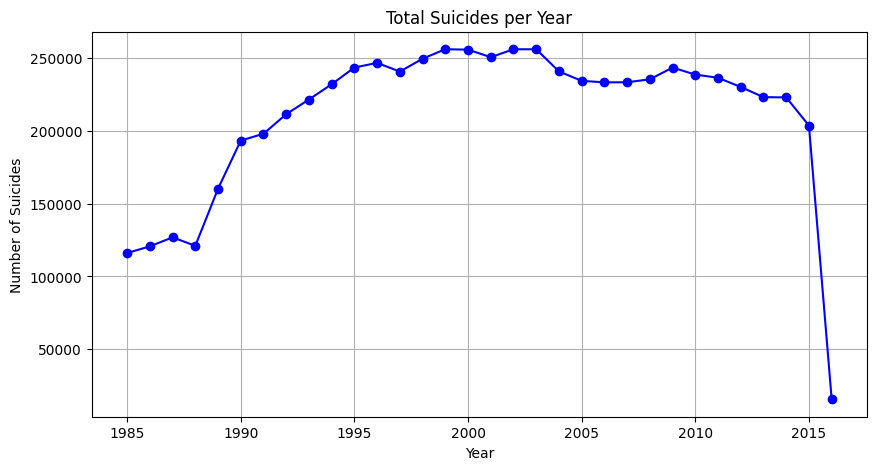

In [34]:
df_year = df.groupby("year")["suicides_no"].sum()

plt.figure(figsize=(10, 5))
plt.plot(df_year.index, df_year.values, marker='o', linestyle='-', color='blue')
plt.title("Total Suicides per Year")
plt.xlabel("Year")
plt.ylabel("Number of Suicides")
plt.grid(True)
plt.show()


#### 2.Scatter Plot: GDP per capita vs Suicide Rate

In [22]:
# Ensure numeric column
df["suicides/100k_pop"] = pd.to_numeric(df["suicides/100k_pop"], errors="coerce")

# Create an attractive Plotly scatter plot
fig = px.scatter(
    df,
    x="gdp_per_capita",
    y="suicides/100k_pop",
    color="sex",  # Change 'sex' to any other category like 'generation' or 'country' if preferred
    hover_data=["country", "year", "population"],
    opacity=0.7,
    size_max=10,
    title="GDP per Capita vs Suicide Rate",
    labels={
        "gdp_per_capita": "GDP per Capita ($)",
        "suicides/100k_pop": "Suicides per 100k"
    },
    template="plotly_white"  # Clean white theme
)

# Customize layout further
fig.update_traces(marker=dict(size=8, line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(
    width=900,
    height=550,
    title_font=dict(size=24, family="Arial Black"),
    font=dict(size=14),
    xaxis=dict(showgrid=True, gridcolor='lightgrey'),
    yaxis=dict(showgrid=True, gridcolor='lightgrey'),
    legend=dict(title="Gender", orientation="h", y=1.1, x=0.5, xanchor="center")
)

fig.show()
  



#### 3.Area Chart: Suicides by Sex Over Time

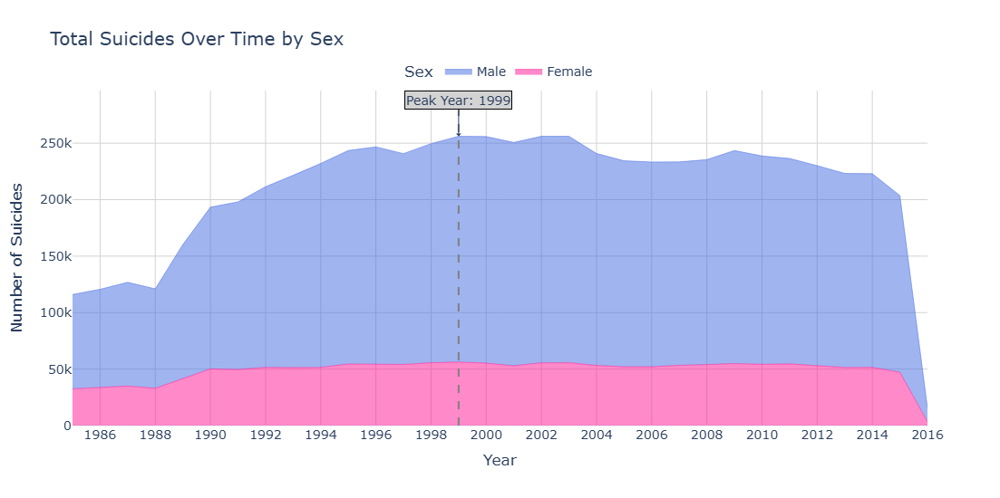

In [23]:
import plotly.graph_objects as go
# Group and reshape the data
df_sex_year = df.groupby(["year", "sex"])["suicides_no"].sum().unstack()

# Custom color mapping for consistency
color_map = {
    "male": "royalblue",
    "female": "deeppink"
}
# Initialize figure
fig = go.Figure()

# Add traces for each sex
for sex in df_sex_year.columns:
    fig.add_trace(go.Scatter(
        x=df_sex_year.index,
        y=df_sex_year[sex],
        name=sex.capitalize(),
        stackgroup='one',
        mode='lines',
        line=dict(width=0.5, color=color_map.get(sex, "gray")),
        hovertemplate=f"Sex: {sex}<br>Year: %{{x}}<br>Suicides: %{{y}}"
    ))

# Find peak total suicide year
peak_year = df_sex_year.sum(axis=1).idxmax()
peak_value = df_sex_year.sum(axis=1).max()

# Add vertical line and annotation for peak
fig.add_vline(x=peak_year, line_dash="dash", line_color="gray")
fig.add_annotation(
    x=peak_year, y=peak_value,
    text=f"Peak Year: {peak_year}",
    showarrow=True,
    arrowhead=1,
    ax=0, ay=-40,
    bgcolor="lightgray",
    bordercolor="black"
)

# Update layout
fig.update_layout(
    title="Total Suicides Over Time by Sex",
    xaxis_title="Year",
    yaxis_title="Number of Suicides",
    hovermode="x unified",
    template="plotly_white",
    width=950,
    height=550,
    font=dict(size=14),
    legend=dict(
        title="Sex",
        orientation="h",
        y=1.1,
        x=0.5,
        xanchor="center"
    ),
    xaxis=dict(
        dtick=2,
        showgrid=True,
        gridcolor='lightgrey'
    ),
    yaxis=dict(
        showgrid=True,
        gridcolor='lightgrey'
    )
)

# Show the figure
fig.show()


#### 4.Bar Chart: Top 10 Countries by Suicide Number

In [24]:
import plotly.express as px
import pandas as pd

# Prepare top 10 countries data
top_countries = df.groupby("country")["suicides_no"].sum().nlargest(10).sort_values(ascending=True)
top_df = top_countries.reset_index()
top_df.columns = ["Country", "Total Suicides"]

# Optional: Add emoji flags (not available for all countries, but you can manually adjust)
# Example mapping (for demo purposes only, adjust as needed)
flag_map = {
    "United States": "🇺🇸", "Russia": "🇷🇺", "Japan": "🇯🇵", "India": "🇮🇳",
    "France": "🇫🇷", "Germany": "🇩🇪", "Ukraine": "🇺🇦", "Brazil": "🇧🇷",
    "Republic of Korea": "🇰🇷", "Poland": "🇵🇱"
}
top_df["Country"] = top_df["Country"].apply(lambda x: f"{flag_map.get(x, '')} {x}")

# Create Plotly bar chart
fig = px.bar(
    top_df,
    x="Total Suicides",
    y="Country",
    orientation="h",
    color="Total Suicides",
    color_continuous_scale=px.colors.sequential.Viridis,
    text="Total Suicides",
    title="Top 10 Countries by Total Suicides",
)

# Update trace aesthetics
fig.update_traces(
    texttemplate="%{text:,}",
    textposition="inside",
    insidetextanchor="start",
    marker_line_color='black',
    marker_line_width=1.2,
    marker=dict(
        line=dict(width=1, color="black"),
        opacity=0.9
    )
)

# Layout customization
fig.update_layout(
    width=950,
    height=600,
    template="plotly_white",
    font=dict(family="Arial Black", size=15),
    title_font=dict(size=24, family="Arial Black"),
    coloraxis_showscale=False,
    xaxis_title="Total Suicides",
    yaxis_title="Country",
    xaxis=dict(showgrid=True, gridcolor="lightgrey"),
    yaxis=dict(categoryorder="total ascending"),
    margin=dict(l=120, r=40, t=70, b=40),
    plot_bgcolor="#f8f9fa"
)

# Show the chart
fig.show()


#### 5.Error Bars: Mean ± Std Suicide Rate by Age

In [25]:
# Prepare aggregated data
age_stats = df.groupby("age")["suicides/100k_pop"].agg(['mean', 'std']).reset_index()

# Ensure age group is sorted properly
age_order = ["5-14 years", "15-24 years", "25-34 years", 
             "35-54 years", "55-74 years", "75+ years"]
age_stats["age"] = pd.Categorical(age_stats["age"], categories=age_order, ordered=True)
age_stats = age_stats.sort_values("age")

# Assign unique colors per age group
colors = px.colors.qualitative.Pastel + px.colors.qualitative.Dark24
age_stats["color"] = colors[:len(age_stats)]

# Build figure
fig = go.Figure()

# Add each age group as a separate point with error bar
for i, row in age_stats.iterrows():
    fig.add_trace(go.Scatter(
        x=[row["age"]],
        y=[row["mean"]],
        mode="markers+text",
        marker=dict(
            size=18,
            color=row["color"],
            line=dict(width=2, color='black'),
            symbol='circle'
        ),
        error_y=dict(
            type='data',
            array=[row["std"]],
            visible=True,
            color='gray',
            thickness=2,
            width=7
        ),
        text=[f"{row['mean']:.1f}"],
        textposition="top center",
        hovertemplate=(
            f"<b>Age Group:</b> {row['age']}<br>"
            f"<b>Mean:</b> {row['mean']:.2f}<br>"
            f"<b>Std Dev:</b> {row['std']:.2f}<extra></extra>"
        ),
        showlegend=False
    ))

# Add connecting dashed line
fig.add_trace(go.Scatter(
    x=age_stats["age"],
    y=age_stats["mean"],
    mode="lines",
    line=dict(color='black', width=2, dash='dot'),
    hoverinfo="skip",
    showlegend=False
))

# Final layout
fig.update_layout(
    title="Mean Suicide Rate by Age Group (with Error Bars)",
    xaxis_title="Age Group",
    yaxis_title="Mean Suicides per 100k",
    template="plotly_white",
    width=950,
    height=550,
    font=dict(family="Arial Black", size=15),
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=True, gridcolor='lightgray', zeroline=False),
    plot_bgcolor="#f6f6f6",
    margin=dict(l=80, r=40, t=80, b=60)
)

# Show the plot
fig.show()


#### 6.Box Plot: Suicide Rate by Generation

In [26]:
# Step 1: Clean the data
df["suicides/100k_pop"] = pd.to_numeric(df["suicides/100k_pop"], errors='coerce')

# Step 2: Define the correct order of generations (from youngest to oldest)
generation_order = ["Generation Z", "Millenials", "Generation X", "Boomers", "Silent", "G.I. Generation"]

# Ensure the column is in categorical order
df["generation"] = pd.Categorical(df["generation"], categories=generation_order, ordered=True)

# Step 3: Create Plotly box plot
fig = px.box(
    df,
    x="generation",
    y="suicides/100k_pop",
    color="generation",
    category_orders={"generation": generation_order},
    color_discrete_sequence=px.colors.qualitative.Set2,
    points="all",  # Show all individual data points (jittered)
    title="Suicide Rate Distribution by Generation"
)

# Step 4: Customize layout
fig.update_traces(
    jitter=0.4,
    marker=dict(size=5, opacity=0.5, line=dict(width=0.5, color="black")),
    boxmean=True  # Adds mean line to the box
)

fig.update_layout(
    template="plotly_white",
    width=950,
    height=550,
    font=dict(family="Arial", size=14),
    title_font=dict(size=22),
    xaxis_title="Generation",
    yaxis_title="Suicides per 100k Population",
    xaxis_tickangle=45,
    showlegend=False,
    plot_bgcolor="#fafafa",
    margin=dict(l=80, r=40, t=80, b=60)
)

# Show the interactive plot
fig.show()


#### 7. Histogram: Suicide Rates Distribution

In [27]:
from scipy.stats import gaussian_kde
# Clean column
df["suicides/100k_pop"] = pd.to_numeric(df["suicides/100k_pop"], errors="coerce")
data = df["suicides/100k_pop"].dropna()

# Mean and median
mean_val = data.mean()
median_val = data.median()

# KDE (Kernel Density Estimate)
kde = gaussian_kde(data)
x_vals = np.linspace(data.min(), data.max(), 500)
kde_vals = kde(x_vals) * len(data) * (x_vals[1] - x_vals[0])  # scale KDE to match histogram

# Create figure
fig = go.Figure()

# Histogram
fig.add_trace(go.Histogram(
    x=data,
    nbinsx=30,
    name="Suicide Rates",
    marker=dict(
        color=data,
        colorscale="Blues",
        line=dict(width=1, color='white')
    ),
    opacity=0.7,
    hovertemplate="Suicide Rate: %{x:.2f}<br>Count: %{y}<extra></extra>"
))

# KDE line
fig.add_trace(go.Scatter(
    x=x_vals,
    y=kde_vals,
    mode='lines',
    line=dict(color='crimson', width=3),
    name='KDE Curve',
    hoverinfo='skip'
))

# Mean line
fig.add_trace(go.Scatter(
    x=[mean_val, mean_val],
    y=[0, max(kde_vals)*1.05],
    mode='lines',
    line=dict(color='green', width=2, dash='dash'),
    name=f"Mean: {mean_val:.2f}"
))

# Median line
fig.add_trace(go.Scatter(
    x=[median_val, median_val],
    y=[0, max(kde_vals)*1.05],
    mode='lines',
    line=dict(color='orange', width=2, dash='dot'),
    name=f"Median: {median_val:.2f}"
))

# Layout improvements
fig.update_layout(
    title="Distribution of Suicide Rates per 100k Population",
    xaxis_title="Suicides per 100k Population",
    yaxis_title="Frequency",
    template="plotly_white",
    width=1000,
    height=550,
    bargap=0.05,
    plot_bgcolor="#fefefe",
    font=dict(family="Arial", size=14),
    title_font=dict(size=22),
    legend=dict(borderwidth=1, bordercolor="lightgray", bgcolor="white")
)

fig.update_xaxes(
    showgrid=True, gridcolor="lightgray", zeroline=False, tickformat=".0f"
)
fig.update_yaxes(
    showgrid=True, gridcolor="lightgray", zeroline=False
)

# Show plot
fig.show()


#### 8.Heatmap: Suicide Rate by Age & Sex

In [28]:
import plotly.express as px
import pandas as pd

# Prepare data
df["suicides/100k_pop"] = pd.to_numeric(df["suicides/100k_pop"], errors="coerce")

# Create pivot table
pivot = df.pivot_table(
    values="suicides/100k_pop",
    index="age",
    columns="sex",
    aggfunc="mean"
).round(1).reset_index()

# Ensure age groups are ordered logically
age_order = ["5-14 years", "15-24 years", "25-34 years", "35-54 years", "55-74 years", "75+ years"]
pivot["age"] = pd.Categorical(pivot["age"], categories=age_order, ordered=True)
pivot = pivot.sort_values("age")

# Melt for long format (needed for plotly express heatmap)
df_melt = pivot.melt(id_vars="age", var_name="sex", value_name="suicides_per_100k")

# Create heatmap
fig = px.density_heatmap(
    df_melt,
    x="sex",
    y="age",
    z="suicides_per_100k",
    color_continuous_scale="inferno",
    text_auto=True,
    title="Suicide Rate Heatmap by Age & Sex"
)

# Layout improvements
fig.update_layout(
    xaxis_title="Sex",
    yaxis_title="Age Group",
    width=700,
    height=500,
    template="plotly_white",
    font=dict(size=14),
    title_font=dict(size=22),
    coloraxis_colorbar=dict(title="Suicides / 100k")
)

# Display
fig.show()



#### 9.Subplots: Suicides by Sex & Generation

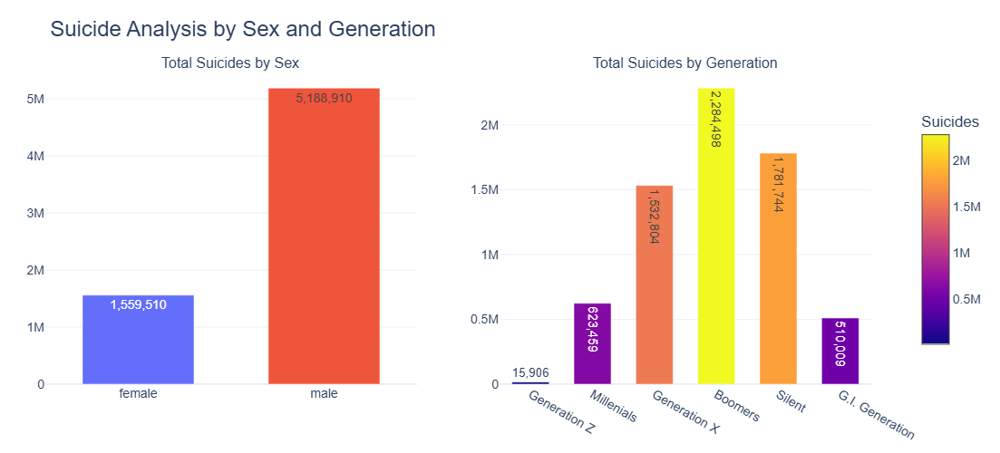

In [35]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Grouping and sorting
sex_totals = df.groupby("sex")["suicides_no"].sum().reset_index()
generation_totals = df.groupby("generation", observed=True)["suicides_no"].sum().reset_index()
# Subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=("Total Suicides by Sex", "Total Suicides by Generation"))

# Bar for Sex
fig.add_trace(
    go.Bar(
        x=sex_totals["sex"],
        y=sex_totals["suicides_no"],
        marker_color=["#636EFA", "#EF553B"],
        text=[f"{val:,}" for val in sex_totals["suicides_no"]],
        textposition="auto",
        width=0.6,
        showlegend=False
    ),
    row=1, col=1
)

# Bar for Generation
fig.add_trace(
    go.Bar(
        x=generation_totals["generation"],
        y=generation_totals["suicides_no"],
        marker=dict(
            color=generation_totals["suicides_no"],
            colorscale="Plasma",
            showscale=True,
            colorbar=dict(
                title="Suicides",
                x=1.05,
                len=0.8
            )
        ),
        text=[f"{val:,}" for val in generation_totals["suicides_no"]],
        textposition="auto",
        width=0.6,
        showlegend=False
    ),
    row=1, col=2
)

# Layout
fig.update_layout(
    title="Suicide Analysis by Sex and Generation",
    title_font_size=24,
    height=500,
    width=1000,
    template="plotly_white",
    font=dict(family="Arial", size=14),
    margin=dict(l=50, r=90, t=80, b=50)
)

fig.show()

#### 10.Polar Chart: Suicides by Age

In [30]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Grouping data by age
age_data = df.groupby("age")["suicides_no"].sum().sort_index()

# Prepare values and labels
values = age_data.values.tolist()
labels = age_data.index.tolist()

# Repeat first element to close the circular chart
values += [values[0]]
labels += [labels[0]]

# Custom color scale for categories
custom_colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692']
colors = custom_colors[:len(labels)]

# Create polar plot
fig = go.Figure()

fig.add_trace(go.Scatterpolar(
    r=values,
    theta=labels,
    mode='lines+markers+text',
    fill='toself',
    line=dict(color='mediumvioletred', width=3),
    marker=dict(size=10, color='lightpink', line=dict(width=2, color='crimson')),
    text=[f'{val:,}' for val in values],
    textposition='top center',
    hovertemplate='<b>Age Group:</b> %{theta}<br><b>Total Suicides:</b> %{r:,}<extra></extra>',
    name='Total Suicides'
))

# Customize layout
fig.update_layout(
    title="Polar Area Chart: Total Suicides by Age Group",
    title_font_size=24,
    polar=dict(
        bgcolor="rgba(0,0,0,0)",
        radialaxis=dict(showticklabels=True, ticks='', gridcolor='lightgray', linecolor='gray'),
        angularaxis=dict(tickfont=dict(size=12), direction='clockwise')
    ),
    font=dict(size=14, family='Arial'),
    showlegend=False,
    template='plotly_white',
    height=650,
    width=750,
    margin=dict(t=100, b=50, l=60, r=60)
)

fig.show()


#### 11.Bubble Chart: Population vs Suicides (Size = GDP)

In [31]:
import plotly.express as px

# Sample for performance (or skip sampling if your system handles large data well)
df_sample = df.sample(1000, random_state=42)

# Clean data: drop rows with missing values in key columns
df_sample = df_sample.dropna(subset=["year", "population", "suicides_no", "gdp_per_capita", "generation", "sex"])

# Create animated bubble chart
fig = px.scatter(
    df_sample,
    x="population",
    y="suicides_no",
    size="gdp_per_capita",
    color="generation",  # you could switch to "sex" for different perspective
    animation_frame="year",
    hover_name="country",
    size_max=40,
    color_discrete_sequence=px.colors.qualitative.Set3,
    hover_data={
        "population": True,
        "suicides_no": True,
        "gdp_per_capita": True,
        "generation": True,
        "sex": True,
        "year": False
    },
    title="Animated Bubble Chart: Population vs Suicides Over Time (Size = GDP per Capita)"
)

# Improve layout
fig.update_layout(
    xaxis_title="Population",
    yaxis_title="Number of Suicides",
    template="plotly_white",
    height=650,
    width=1000,
    font=dict(family="Segoe UI", size=14),
    margin=dict(l=60, r=60, t=80, b=60),
    legend_title_text="Generation",
    updatemenus=[{
        "buttons": [
            {
                "args": [None, {"frame": {"duration": 800, "redraw": True},
                                "fromcurrent": True}],
                "label": "Play",
                "method": "animate"
            },
            {
                "args": [[None], {"frame": {"duration": 0, "redraw": True},
                                  "mode": "immediate",
                                  "transition": {"duration": 0}}],
                "label": "⏸ Pause",
                "method": "animate"
            }
        ],
        "direction": "left",
        "pad": {"r": 10, "t": 87},
        "showactive": False,
        "type": "buttons",
        "x": 0.1,
        "xanchor": "right",
        "y": 0,
        "yanchor": "top"
    }]
)

# Axes type can be changed if needed (e.g. log scale for better spread)
fig.update_xaxes(type="log", showgrid=True)
fig.update_yaxes(showgrid=True)

fig.show()


#### 12.Choropleth Map: Total Suicides by Country

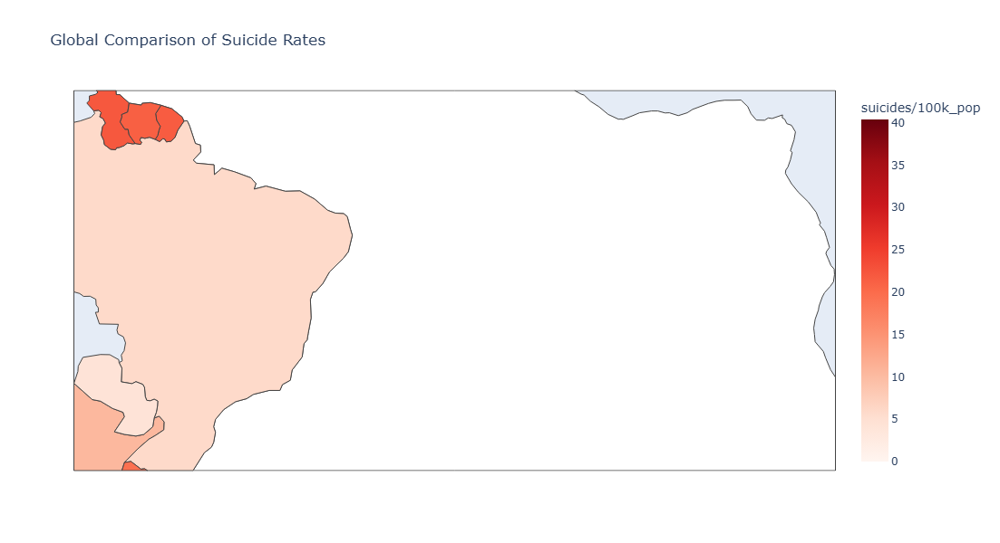

In [32]:
import plotly.express as px

# Aggregate data by country
country_avg_suicides = df.groupby('country')['suicides/100k_pop'].mean().reset_index()

# Plot with increased size
fig = px.choropleth(
    country_avg_suicides,
    locations='country',
    locationmode='country names',
    color='suicides/100k_pop',
    title='Global Comparison of Suicide Rates',
    color_continuous_scale='Reds',
    width=1000,   # width in pixels
    height=600    # height in pixels
)

fig.show()


#### pie chart

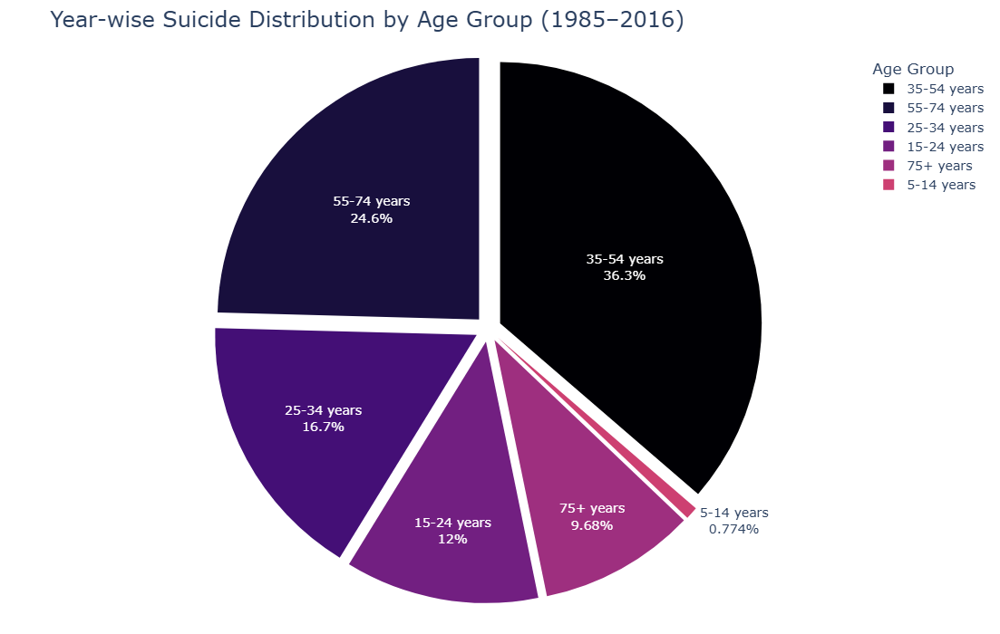

In [33]:
# Optional: set consistent age order
age_order = ['5-14 years', '15-24 years', '25-34 years', '35-54 years', '55-74 years', '75+ years']
df['age'] = pd.Categorical(df['age'], categories=age_order, ordered=True)

# Group by year and age (avoid FutureWarning)
age_year_data = df.groupby(['year', 'age'], observed=False)['suicides_no'].sum().reset_index()

# Plot large animated pie chart
fig = px.pie(
    age_year_data,
    names='age',
    values='suicides_no',
    title='Year-wise Suicide Distribution by Age Group (1985–2016)',
    color_discrete_sequence=px.colors.sequential.Magma,
    width=1000,
    height=700
)

fig.update_traces(
    textinfo='percent+label',
    pull=[0.05] * len(age_order),
    textfont_size=14
)

fig.update_layout(
    title_font_size=24,
    legend_title_text='Age Group',
    legend_font_size=14,
    margin=dict(t=60, b=30, l=40, r=40),
    uniformtext_minsize=12,
    uniformtext_mode='hide'
)

fig.show()
